Comparing the results of the map fits to the 1D rotation curve fits.  In general, I will be using the average velocity fits, since the majority of galaxies used this fit for their "good" fit.

In [1]:
from astropy.table import Table

import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

## Data

In [2]:
#data_filename = '../spirals/Pipe3D-master_file_vflag_BB_minimize_chi10_smooth2p27_mapFit_N2O2_noWords.txt'
data_filename = '../spirals/Pipe3D-master_file_vflag_BB_minimize_chi10_smooth2p27_mapFit_N2O2_HIdr2_noWords_v5.txt'

data = Table.read(data_filename, format='ascii.commented_header')

In [3]:
data.show_in_notebook()

idx,MaNGA_plate,MaNGA_IFU,NSA_plate,NSA_fiberID,NSA_MJD,NSA_index,NSA_RA,NSA_DEC,NSA_ba,NSA_phi,NSA_redshift,NSA_Mstar,vflag,avg_v_max,avg_v_max_sigma,avg_alpha,avg_alpha_sigma,avg_chi_square_rot,pos_v_max,pos_v_max_sigma,pos_alpha,pos_alpha_sigma,pos_chi_square_rot,neg_v_max,neg_v_max_sigma,neg_alpha,neg_alpha_sigma,neg_chi_square_rot,center_flux,center_flux_error,Mtot,Mtot_error,Mdark,Mdark_error,Mstar,Mdark_Mstar_ratio,Mdark_Mstar_ratio_error,rabsmag,avg_r_turn,avg_r_turn_sigma,pos_r_turn,pos_r_turn_sigma,neg_r_turn,neg_r_turn_sigma,logNO,t3,BPT,curve_used,points_cut,avg_chi_square_ndf,pos_chi_square_ndf,neg_chi_square_ndf,index,Z12logOH,u_r,frac_masked_spaxels,Rmax,Mtot_Mstar_ratio,Mtot_Mstar_ratio_error,smoothness_score,pos_Vmax_data,avg_Vmax_data,neg_Vmax_data,ba_map,ba_err_map,phi_map,phi_err_map,Vsys_map,Vsys_err_map,x0_map,x0_err_map,y0_map,y0_err_map,Vmax_map,Vmax_err_map,alpha_map,alpha_err_map,Rturn_map,Rturn_err_map,M90_map,M90_err_map,Sigma_disk_map,Sigma_disk_err_map,Rdisk_map,Rdisk_err_map,M90_disk_map,M90_disk_err_map,DRP_map_smoothness,NSA_elpetro_th90,chi2_map,chi2_disk_map,logHI,WF50,WP20,CMD_class,map_fit_flag
0,8466,6101,1438,139,53054,294037,168.0940308708338,44.81603706485203,0.6000820994377136,22.0548095703125,0.12233314663171768,144223535104.0,-9.0,574.8512281341687,9.095951605839385,1.7903772885769094,0.23250158624860973,64.50345321473802,979.0377448547318,7.095000328501162,2.0965763839938587,0.1977960838872132,30.863088739261528,167.6048904583456,1.6829306878660513,100.0,115.95561429702688,390.70777030309875,0.08372113108634949,0.00163589562924352,4358832534297.054,63176227074.445984,4059002308232.0713,63176227074.445984,299830226064.98267,13.537668838472468,0.21070666524713122,-22.167272567749023,1.4791260912861077,0.16907432810428674,1.41653521033679,0.2055252777876183,7.023474328427643,0.06357492840470455,-99.0,-99.0,2.0,-99,4,16.125863303684504,7.715772184815382,97.67694257577469,1238750,-99.0,2.598399519920349,0.08690404345202173,19.55835846649855,14.537668838472468,0.21070666524713122,2.15120792325884,1349.5788827920555,740.5274722782723,302.02938662785806,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,4222.966255664543,488.57367242616033,2.7228117884257457,0.1940942375548099,11.26042936714101,13.750839171898207,2.4065669724921217,11.610634803771973,-99.0,60523723.058375955,-99.0,-99.0,-99.0,3,-99.0
1,10001,12704,483,456,51924,59044,133.98996686918764,57.677967666915094,0.15000000596046448,81.21926879882812,0.014121513813734055,4286639360.0,2.0,131.01025240011285,19.676026158251116,2.8987493963655893,0.9320010517634041,10.561579728586807,167.36819730056942,55.37941486751162,1.5603496124473835,0.7384203259825936,47.04399759256833,114.38748951090233,2.066567760147777,11.186389689559748,5.360847852417152,33.66362235935509,0.04750613123178482,0.00122847675844281,13105279432.977133,3936483090.9370747,5510141659.441766,3936483090.9370747,7595137773.535367,0.7254827790802428,0.5182898860180557,-18.730289459228516,2.373751698007841,0.442445748488078,2.7436231797149664,0.8109164906414781,2.2338502327998295,0.0792251267877304,-99.0,-99.0,-99.0,0,0,0.8124292098912929,3.6187690455821793,2.5895094122580837,-1,-99.0,2.1984682977199554,0.2559453032104637,3.2839520528476394,1.7254827790802427,0.5182898860180557,1.4387059747053537,120.31707348143723,117.87988927383222,-6.000375169033698,0.28730647575776236,0.9986260813030094,83.5243468619262,1.4387511335492842,-5.666760108927219,3.4111615424323802,37.52357451505505,0.5440523602879984,39.039966497505404,0.8437089910026434,252.01306869263024,237.82742645826283,0.9271975361945954,0.8596508501129145,2.9952996853558345,1.5331495508284634,11.00212957873045,11.277998448106779,1226.8826834368272,42.21839027025036,1.0806885517253293,0.023583319463693266,9.95438400669585,11.847215121786643,0.8818602095452142,33.156402587890625,15.738171918263944,35941367.32412297,9.239542007446289,298.85899314722644,295.953987

In [3]:
bad_boolean = np.logical_or.reduce([data['M90_map'] == -99, 
                                    data['M90_disk_map'] == -99])

good_map_galaxies = data[~bad_boolean]

print(len(good_map_galaxies))

3006


# Compare $\alpha$

<IPython.core.display.Javascript object>


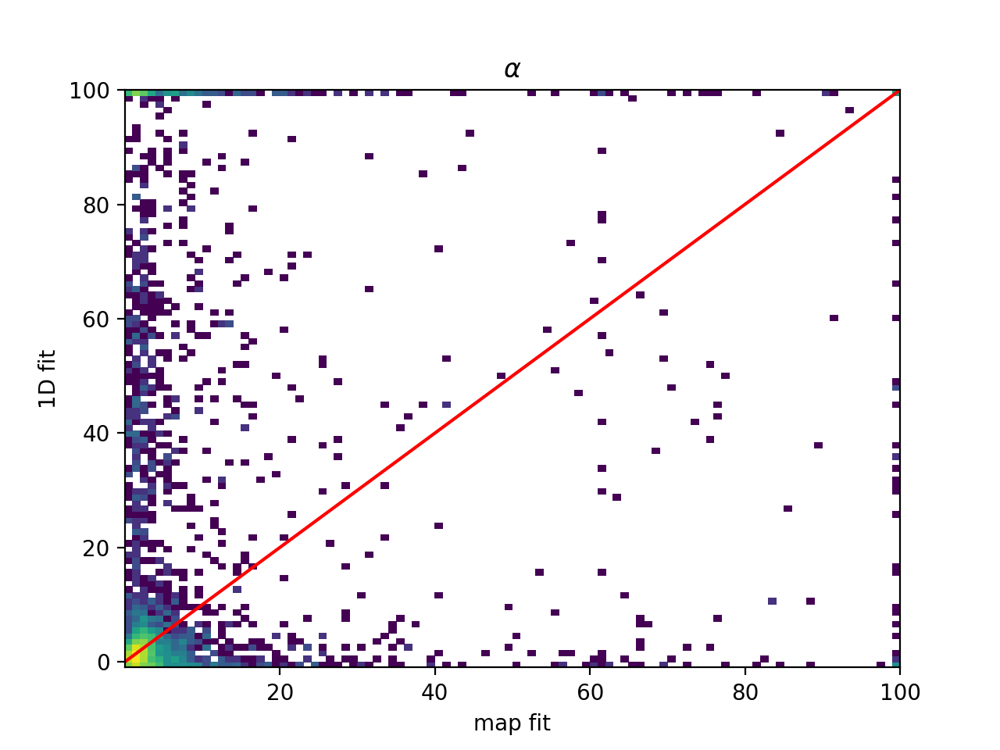

In [4]:
plt.figure()

plt.hist2d(good_map_galaxies['alpha_map'], 
           good_map_galaxies['avg_alpha'], 
           norm=mpl.colors.LogNorm(), bins=[100, 100])

plt.plot([0,100], [0,100], 'r')

plt.title(r'$\alpha$')
plt.xlabel('map fit')
plt.ylabel('1D fit');

##### What is the distribution of $\alpha$ from the 1D fits for those objects with $\alpha = 100$ in the map fit?

<IPython.core.display.Javascript object>


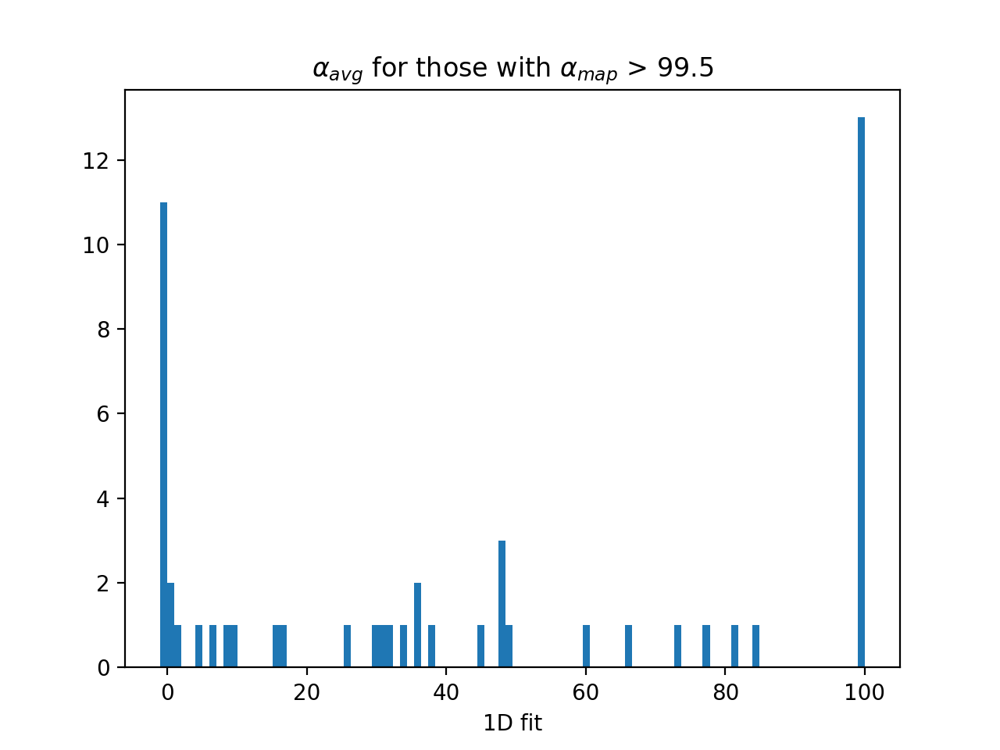

In [5]:
plt.figure()

plt.hist(good_map_galaxies['avg_alpha'][good_map_galaxies['alpha_map'] > 99.5], bins=100)

plt.title(r'$\alpha_{avg}$ for those with $\alpha_{map}$ > 99.5')
plt.xlabel('1D fit');

##### What is the distribution of $M_{90}/\sigma_{M_{90}}$ from the 1D fits for those objects with $\alpha = 100$ in the map fit?

<IPython.core.display.Javascript object>


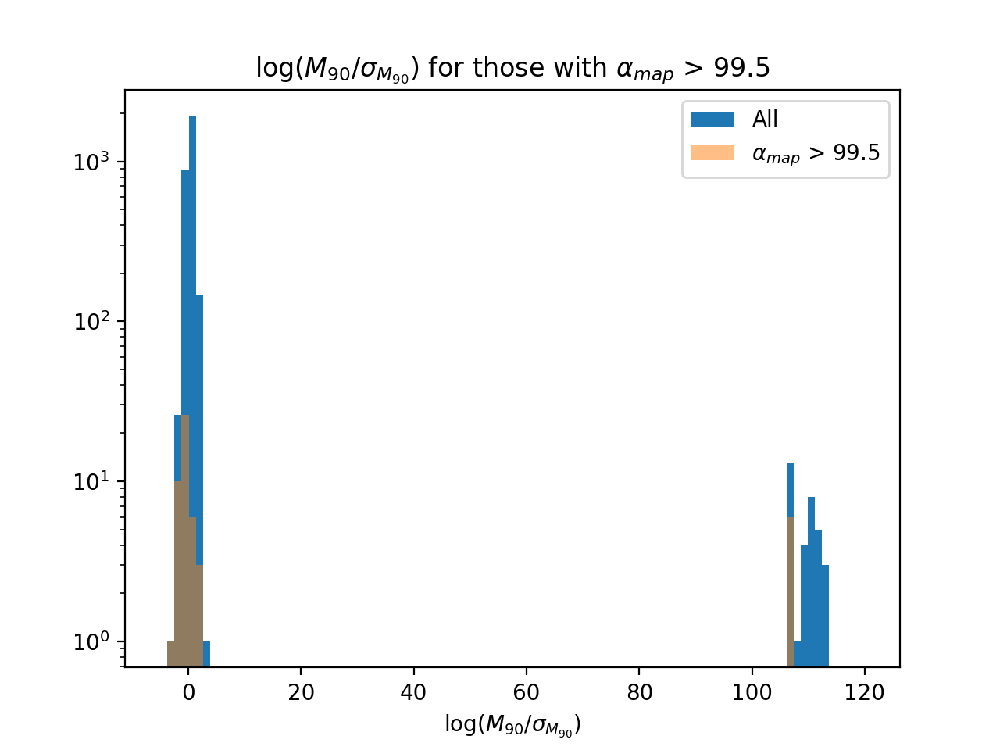

In [6]:
plt.figure()

bins = np.linspace(-5,120,100)

plt.hist((good_map_galaxies['M90_map'] - good_map_galaxies['M90_err_map']), bins=bins, label='All')
plt.hist((good_map_galaxies['M90_map'] - good_map_galaxies['M90_err_map'])[good_map_galaxies['alpha_map'] > 99.5], 
         bins=bins, label=r'$\alpha_{map}$ > 99.5', alpha=0.5)

plt.yscale('log')

plt.title(r'log($M_{90}/\sigma_{M_{90}}$) for those with $\alpha_{map}$ > 99.5')
plt.xlabel(r'log($M_{90}/\sigma_{M_{90}}$)')

plt.legend();

<IPython.core.display.Javascript object>


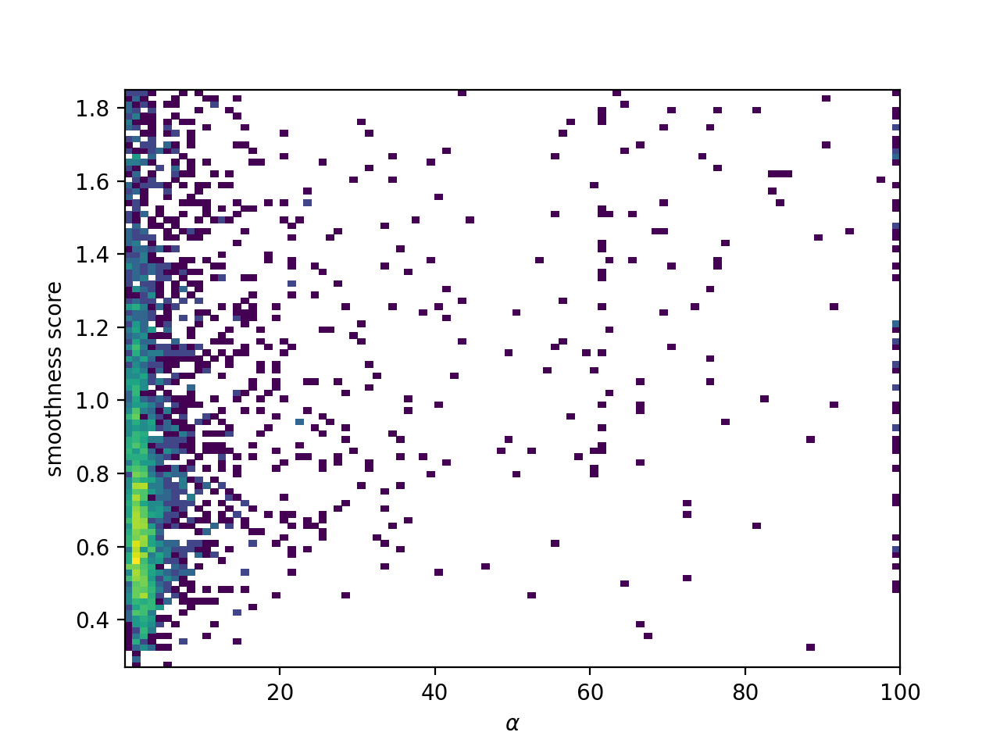

In [7]:
plt.figure()

plt.hist2d(good_map_galaxies['alpha_map'], 
           good_map_galaxies['DRP_map_smoothness'], 
           norm=mpl.colors.LogNorm(), bins=[100, 100])

#plt.title(r'$\alpha$')
plt.xlabel(r'$\alpha$')
plt.ylabel('smoothness score');

<IPython.core.display.Javascript object>


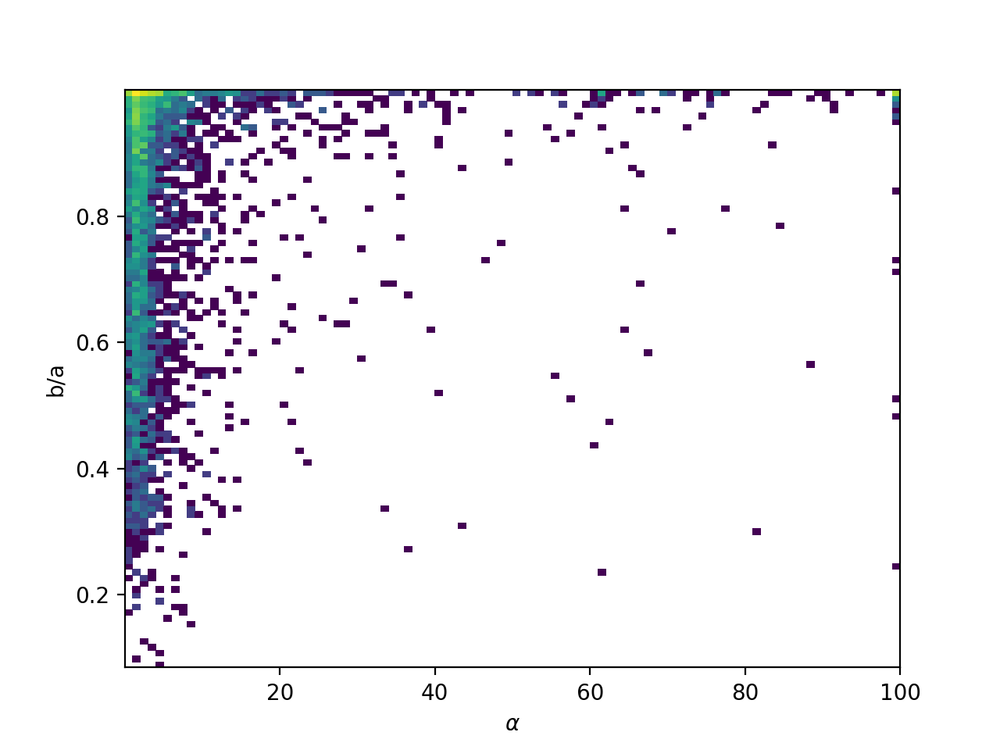

In [8]:
plt.figure()

plt.hist2d(good_map_galaxies['alpha_map'], 
           good_map_galaxies['ba_map'], 
           norm=mpl.colors.LogNorm(), bins=[100, 100])

#plt.title(r'$\alpha$')
plt.xlabel(r'$\alpha$')
plt.ylabel('b/a');

##### What is the distribution in $V_{max}$ and $R_{turn}$ for those objects with $\alpha = 100$ in the map fit?

<IPython.core.display.Javascript object>


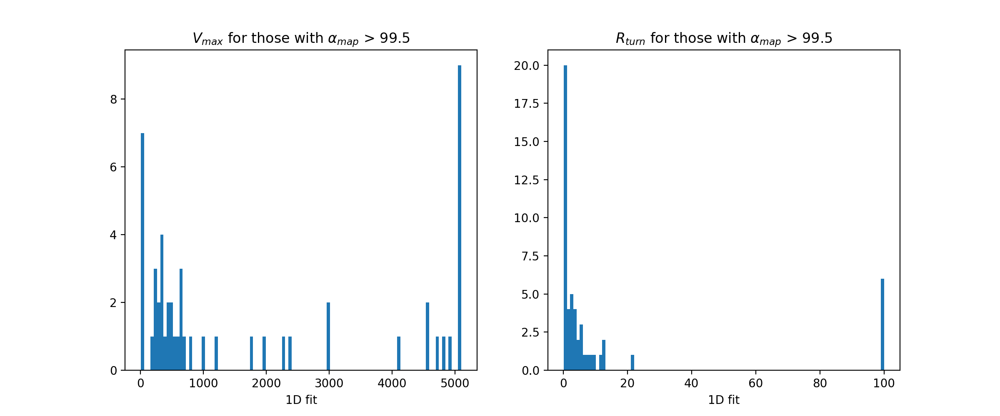

In [9]:
plt.figure(figsize=(12,5))

plt.subplot(121)
plt.hist(good_map_galaxies['Vmax_map'][good_map_galaxies['alpha_map'] > 99.5], bins=100)

plt.title(r'$V_{max}$ for those with $\alpha_{map}$ > 99.5')
plt.xlabel('1D fit')


plt.subplot(122)
plt.hist(good_map_galaxies['Rturn_map'][good_map_galaxies['alpha_map'] > 99.5], bins=100)

plt.title(r'$R_{turn}$ for those with $\alpha_{map}$ > 99.5')
plt.xlabel('1D fit');

# Compare $V_\text{max}$

<IPython.core.display.Javascript object>


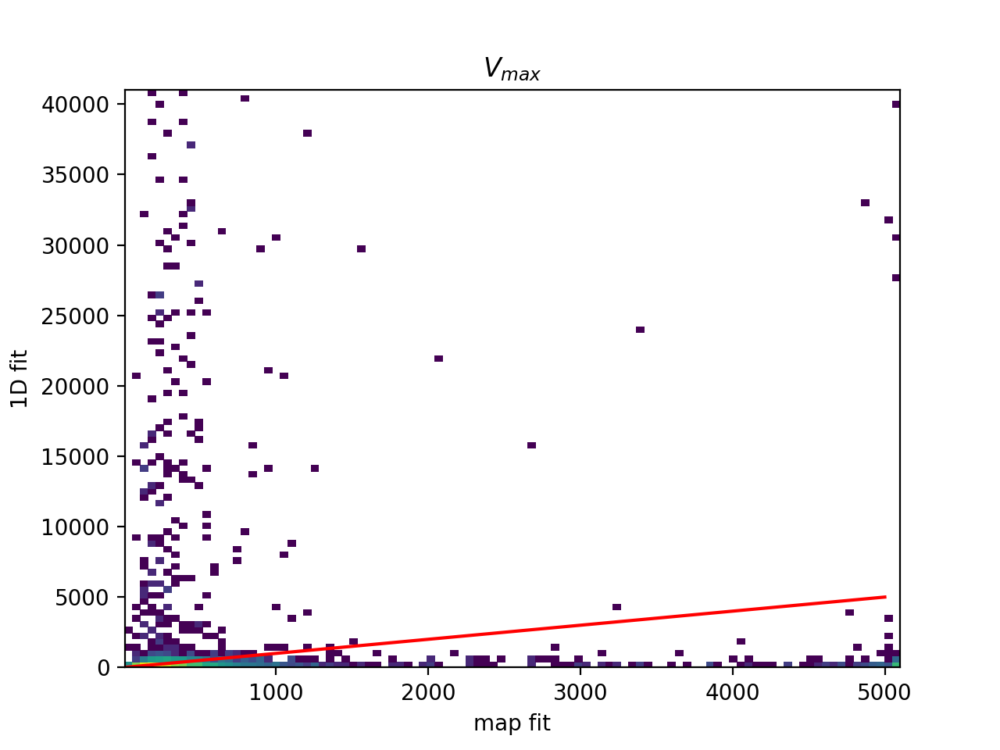

In [10]:
plt.figure()

plt.hist2d(good_map_galaxies['Vmax_map'], 
           good_map_galaxies['avg_v_max'], 
           norm=mpl.colors.LogNorm(), bins=[100, 100])

plt.plot([0,5000], [0,5000], 'r')

plt.title('$V_{max}$')
plt.xlabel('map fit')
plt.ylabel('1D fit');

##### What is the distribution in $V_\text{max}$ from the 1D fits for those with $V_\text{max} > 5000$?

<IPython.core.display.Javascript object>


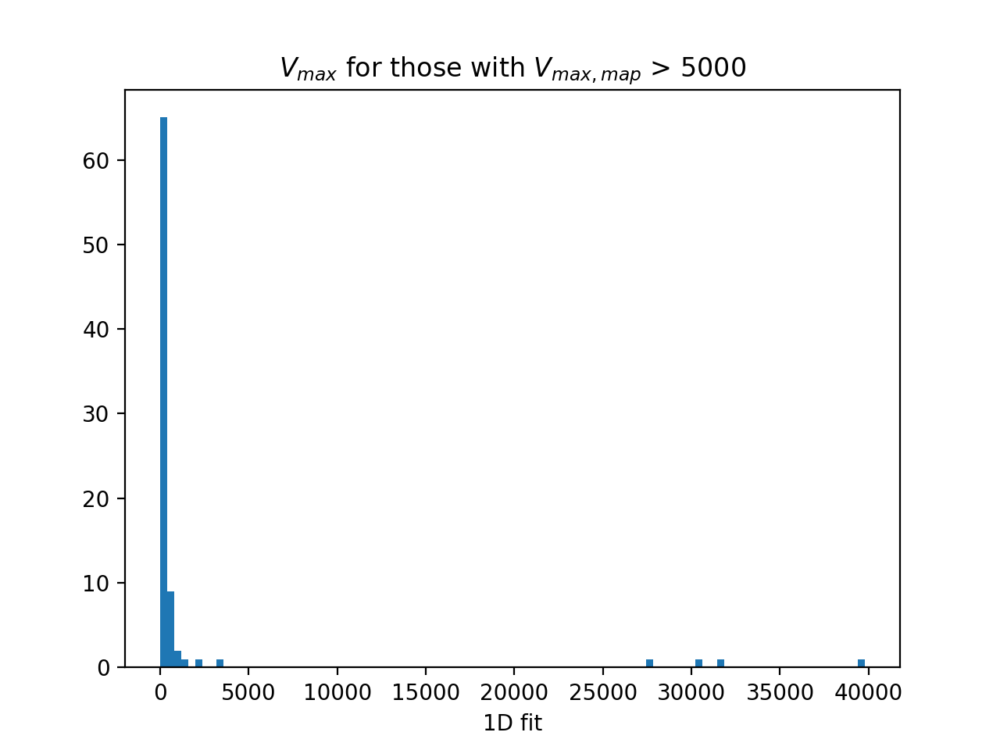

In [11]:
plt.figure()

plt.hist(good_map_galaxies['avg_v_max'][good_map_galaxies['Vmax_map'] > 5000], bins=100)

plt.title('$V_{max}$ for those with $V_{max, map}$ > 5000')
plt.xlabel('1D fit');

##### What is the distribution in $\alpha$ and $R_{turn}$ for those objects with $V_\text{max} > 5000$ in the map fit?

<IPython.core.display.Javascript object>


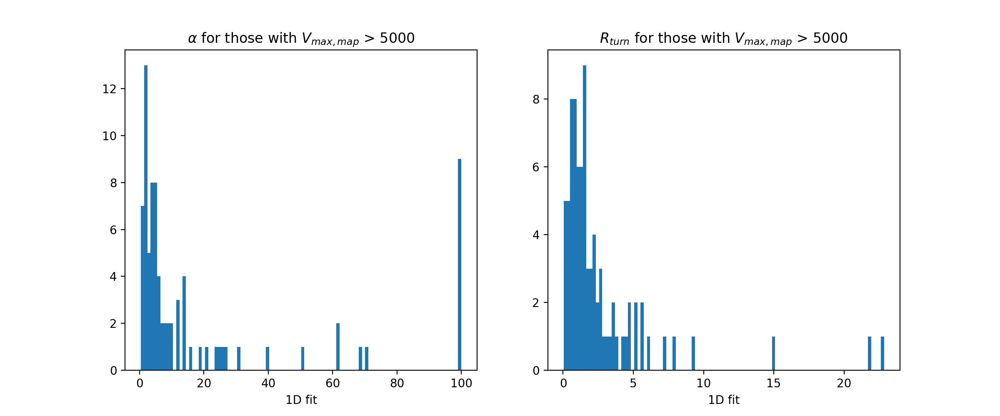

In [12]:
plt.figure(figsize=(12,5))

plt.subplot(121)
plt.hist(good_map_galaxies['alpha_map'][good_map_galaxies['Vmax_map'] > 5000], bins=100)

plt.title(r'$\alpha$ for those with $V_{max, map}$ > 5000')
plt.xlabel('1D fit')


plt.subplot(122)
plt.hist(good_map_galaxies['Rturn_map'][good_map_galaxies['Vmax_map'] > 5000], bins=100)

plt.title(r'$R_{turn}$ for those with $V_{max, map}$ > 5000')
plt.xlabel('1D fit');

# Compare $R_\text{turn}$

<IPython.core.display.Javascript object>


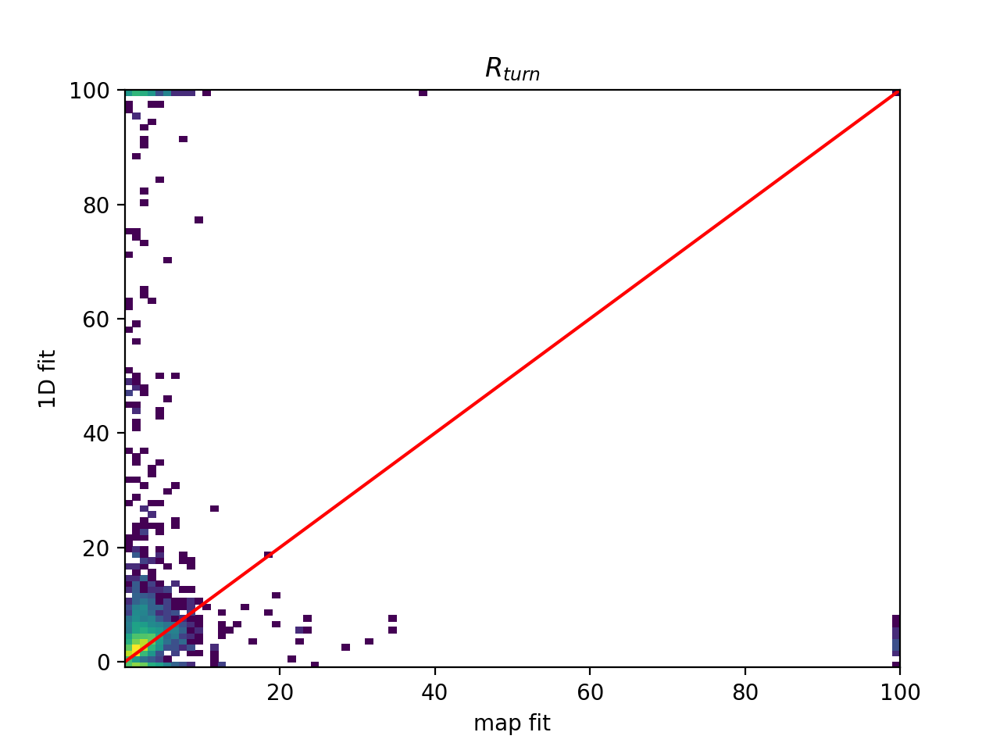

In [13]:
plt.figure()

plt.hist2d(good_map_galaxies['Rturn_map'], 
           good_map_galaxies['avg_r_turn'], 
           norm=mpl.colors.LogNorm(), bins=[100, 100])

plt.plot([0,100], [0,100], 'r')

plt.title('$R_{turn}$')
plt.xlabel('map fit')
plt.ylabel('1D fit');

##### What is the distribution in $R_\text{turn}$ from the 1D fits for those with $R_\text{turn} = 100$?

<IPython.core.display.Javascript object>


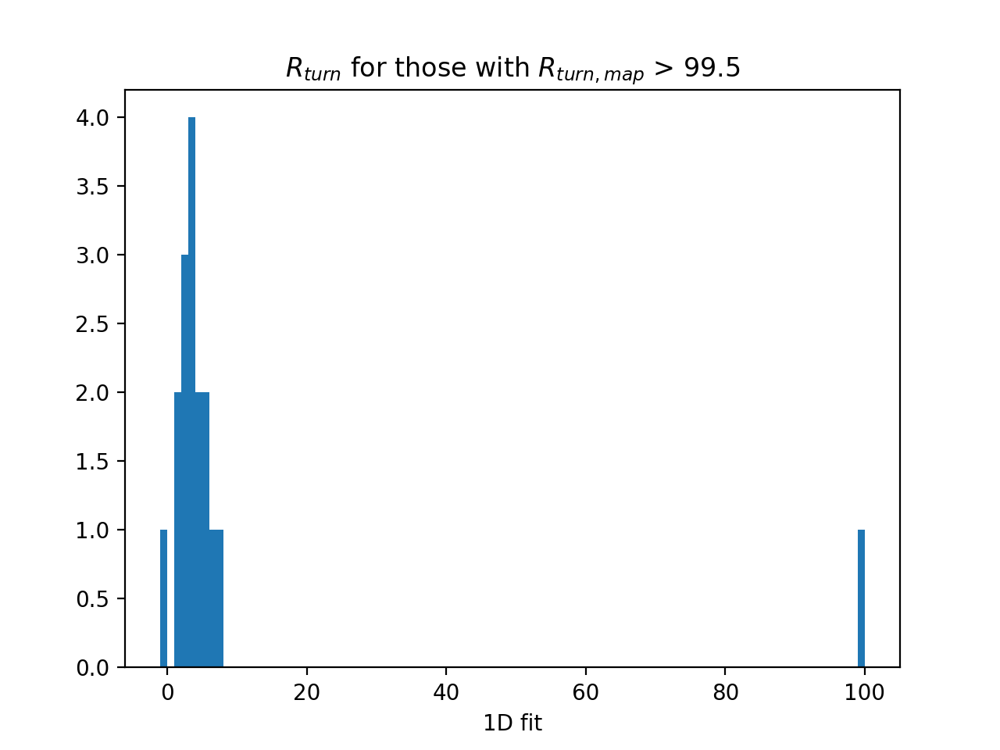

In [14]:
plt.figure()

plt.hist(good_map_galaxies['avg_r_turn'][good_map_galaxies['Rturn_map'] > 99.5], bins=100)

plt.title('$R_{turn}$ for those with $R_{turn, map}$ > 99.5')
plt.xlabel('1D fit');

##### What is the distribution in $\alpha$ and $V_\text{max}$ for those objects with $R_\text{turn} > 99.5$ in the map fit?

<IPython.core.display.Javascript object>


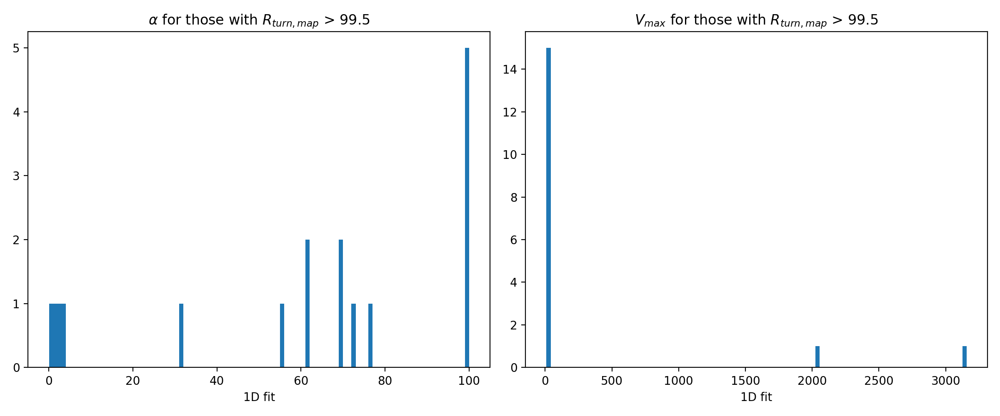

In [15]:
plt.figure(figsize=(12,5))

plt.subplot(121)
plt.hist(good_map_galaxies['alpha_map'][good_map_galaxies['Rturn_map'] > 99.5], bins=100)

plt.title(r'$\alpha$ for those with $R_{turn, map}$ > 99.5')
plt.xlabel('1D fit')


plt.subplot(122)
plt.hist(good_map_galaxies['Vmax_map'][good_map_galaxies['Rturn_map'] > 99.5], bins=100)

plt.title('$V_{max}$ for those with $R_{turn, map}$ > 99.5')
plt.xlabel('1D fit')

plt.tight_layout();

# Compare $M_\text{tot}$

In [16]:
# Need to also remove galaxies with bad 1D fits (Mtot = -1)
bad_1D_fits = good_map_galaxies['curve_used'] == -99

<IPython.core.display.Javascript object>


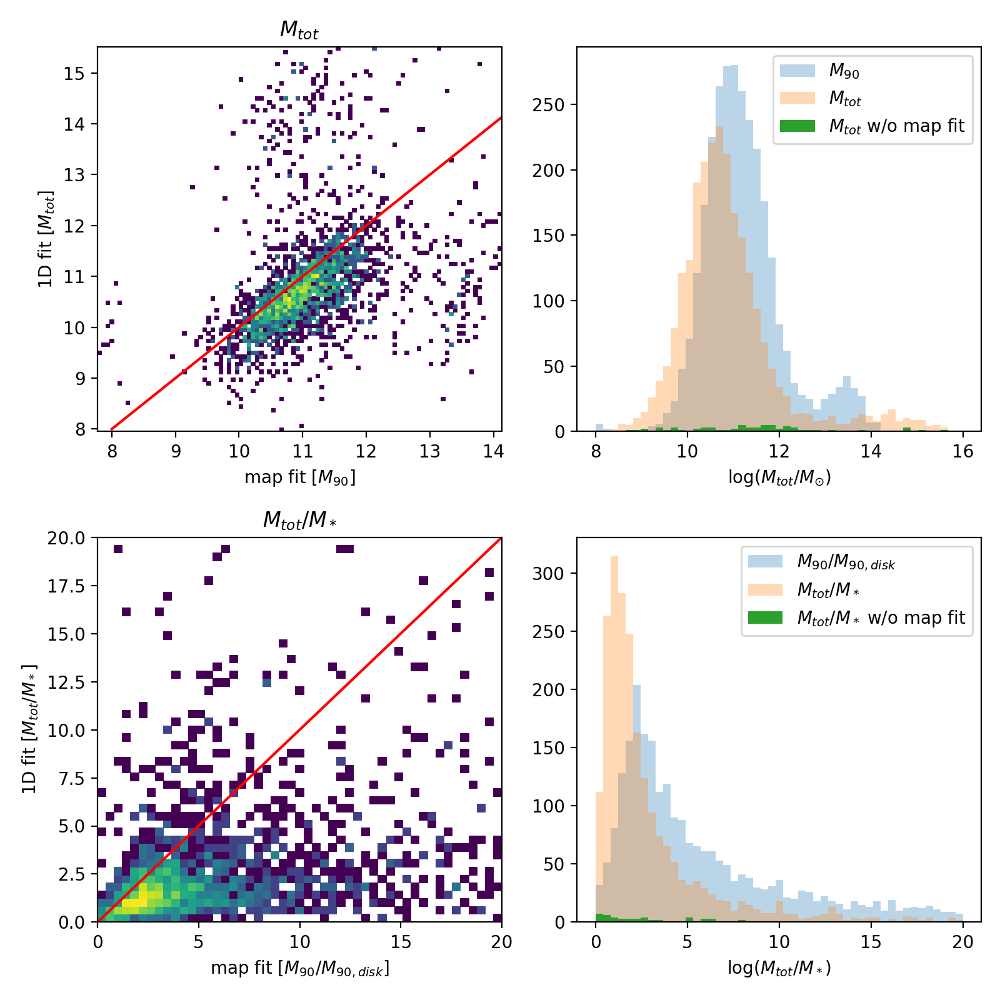

In [17]:
plt.figure(figsize=(8,8))

plt.subplot(221)
plt.hist2d(good_map_galaxies['M90_map'][~bad_1D_fits], 
           np.log10(good_map_galaxies['Mtot'][~bad_1D_fits]), 
           norm=mpl.colors.LogNorm(), bins=[100, 100])

plt.plot([8,16], [8,16], 'r')

plt.title('$M_{tot}$')
plt.xlabel('map fit [$M_{90}$]')
plt.ylabel('1D fit [$M_{tot}$]')



plt.subplot(222)

Mtot_bins = np.linspace(8,16, 50)
plt.hist(good_map_galaxies['M90_map'], bins=Mtot_bins, alpha=0.3, label='$M_{90}$')
plt.hist(np.log10(data['Mtot'][data['curve_used'] != -99]), 
         bins=Mtot_bins, alpha=0.3, label='$M_{tot}$')
plt.hist(np.log10(data['Mtot'][np.logical_and(data['curve_used'] != -99, data['M90_map'] == -99)]), 
         bins=Mtot_bins, 
         label='$M_{tot}$ w/o map fit')

plt.xlabel(r'log($M_{tot}/M_{\odot}$)')

plt.legend()


Mratio_bins = np.linspace(0,20, 50)


plt.subplot(223)
plt.hist2d(10**(good_map_galaxies['M90_map'][~bad_1D_fits] - good_map_galaxies['M90_disk_map'][~bad_1D_fits]), 
           good_map_galaxies['Mtot_Mstar_ratio'][~bad_1D_fits], 
           norm=mpl.colors.LogNorm(), bins=Mratio_bins)

plt.plot([0,20], [0,20], 'r')

plt.title('$M_{tot}/M_*$')
plt.xlabel('map fit [$M_{90}/M_{90, disk}$]')
plt.ylabel('1D fit [$M_{tot}/M_*$]')



plt.subplot(224)

plt.hist(10**(good_map_galaxies['M90_map'] - good_map_galaxies['M90_disk_map']), 
         bins=Mratio_bins, 
         alpha=0.3, 
         label='$M_{90}/M_{90, disk}$')
plt.hist(data['Mtot_Mstar_ratio'][data['curve_used'] != -99], 
         bins=Mratio_bins, 
         alpha=0.3, 
         label='$M_{tot}/M_*$')
plt.hist(data['Mtot_Mstar_ratio'][np.logical_and(data['curve_used'] != -99, data['M90_map'] == -99)], 
         bins=Mratio_bins, 
         label='$M_{tot}/M_*$ w/o map fit')

plt.xlabel(r'log($M_{tot}/M_*$)')

plt.legend()

plt.tight_layout();

In [18]:
print('Number of objects with map fits:', len(good_map_galaxies))
print('Number of objects with 1D fits:', np.sum(data['curve_used'] != -99))
print('Number of objects with good 1D and map fits:', len(good_map_galaxies[~bad_1D_fits]))

Number of objects with map fits: 3006
Number of objects with 1D fits: 2461
Number of objects with good 1D and map fits: 2350


<IPython.core.display.Javascript object>


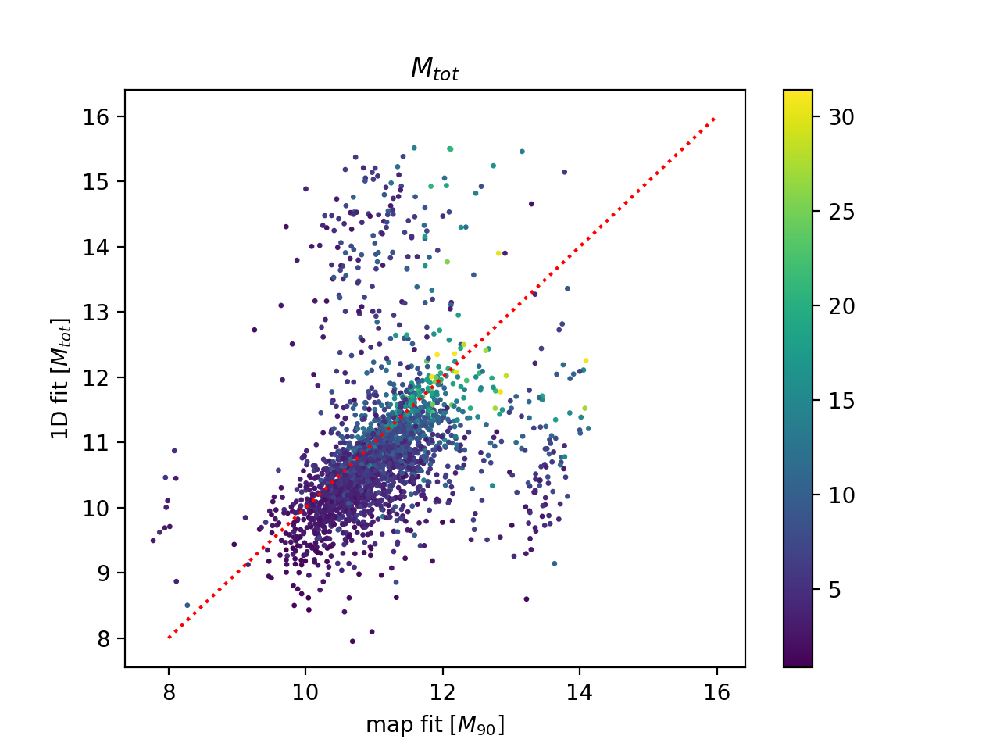

In [19]:
plt.figure()

plt.scatter(good_map_galaxies['M90_map'][~bad_1D_fits], 
            np.log10(good_map_galaxies['Mtot'][~bad_1D_fits]), 
            c=good_map_galaxies['Rmax'][~bad_1D_fits], s=2)

plt.plot([8,16], [8,16], 'r:')

plt.colorbar()

plt.title('$M_{tot}$')
plt.xlabel('map fit [$M_{90}$]')
plt.ylabel('1D fit [$M_{tot}$]');

## Compare b/a

In [20]:
plt.figure()

plt.scatter(good_map_galaxies['ba_map'], 
            good_map_galaxies['NSA_ba'], 
            s=2)

plt.plot([0,1], [0,1], 'r:')

plt.title('b/a')
plt.xlabel('map fit')
plt.ylabel('NSA');

<IPython.core.display.Javascript object>